<a href="https://colab.research.google.com/github/cdragicevic/neurosystems/blob/master/Main_EyeLink_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# by Tino (cdragicevic@gmail.com)
#############################################################################
#############################################################################
# El objetivo de este código es leer correctamente los archivos .asc exportados desde el software oficial de SR Research - EyeLink
# Para la lectura de los datos, se utiliza la función edf_reader() de la librería PythonPyGazeAnalyser https://github.com/esdalmaijer/PyGazeAnalyser, 
# la cual es cargada desde mi google drive, que se debe montar utilizando una clave. 
# Existen otras librerías acá https://github.com/davebraze/FDBeye/wiki/Researcher-Contributed-Eye-Tracking-Tools#python-packages, y puede 
# haber unas mejores ya que la que utilicé ni siquiera considera datos de cada ojo, sino que está programada (al parecer) para registros de un sólo ojo. 
# De todos modos, una de las ventajas sería que la librería se presentó con un paper así que se epuede citar.
# Por lo tanto, y como los datos de prueba que he usado tienen 'eventos' (sacadas/fijacines, pestañeos) para cada ojo, 
# debí modificar la librería original.
# La librería me falla cuando deseo graficar utilizando sus funciones. Como plan B, pasé los datos a panda y ahí apliqué histograma para 
# luego graficar con matplotlib
#
# De todos modos, el código básico de lectura es leer líneas (o filas) completas del archivo de texto .asc, y a partir de ahí
# se buscan los eventos oculares y mensajes.
# file = open(file_root, 'r')
# data = fl.readlines()
#
# Hasta el momento y a modo de prueba, éste código sólo funciona (en parte) para el ojo izquierdo, y genera histogramas en eje X e Y de los pixeles visitados.
#
#############################################################################
#############################################################################

import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
#import PythonPyGazeAnalyser

# Incorporar mi google drive al proyecto. Se accede a través de 'drive/My Drive' o 'drive/Shared Drives' según corresponda. Lamentáblemente pide un password cada vez que se cierra la sesión.
from google.colab import drive 
#drive.mount('/content/drive/')
#Or to remount by force
drive.mount('/content/drive/', force_remount=True)
# pass: 4/3AHlM6131Ha2LDmTDx_oq6vARenx-MfT7Gv6KKdCxT2_bxVZVn6-56M

#Esta es la ruta es de la librería PyGazeAnalyser que tengo en mi google drive. Cualquier modificación debe hacerse ahí
mipath="drive/My Drive/Python_Codes/PyGazeAnalyser-master/pygazeanalyser/"

!cp "drive/My Drive/Python_Codes/PyGazeAnalyser-master/pygazeanalyser/edfreader2.py" .
import edfreader2
!cp "drive/My Drive/Python_Codes/PyGazeAnalyser-master/pygazeanalyser/gazeplotter.py" .
import gazeplotter
#from pygazeanalyser.gazeplotter import draw_fixations, draw_heatmap, draw_scanpath, draw_raw

# Fin bloque de importaciones

Mounted at /content/drive/


findfont: Font family ['Ubuntu'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Ubuntu'] not found. Falling back to DejaVu Sans.


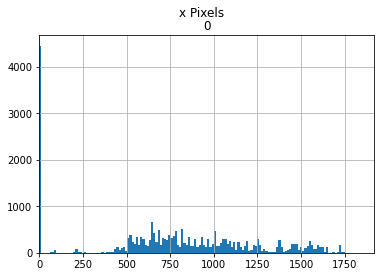

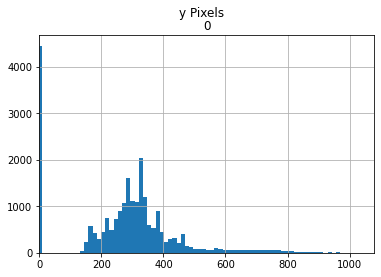

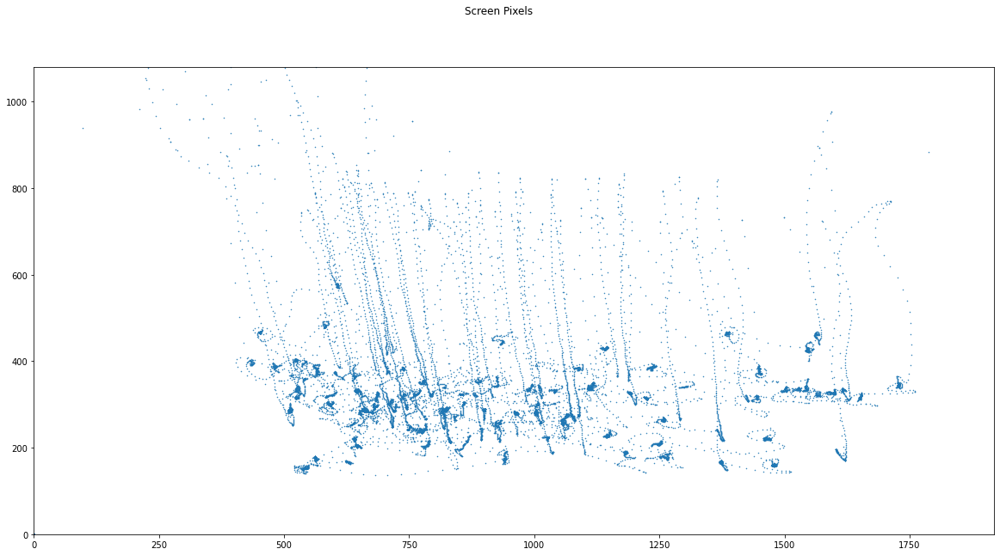

Text(0.5, 0.98, 'Screen Pixels')

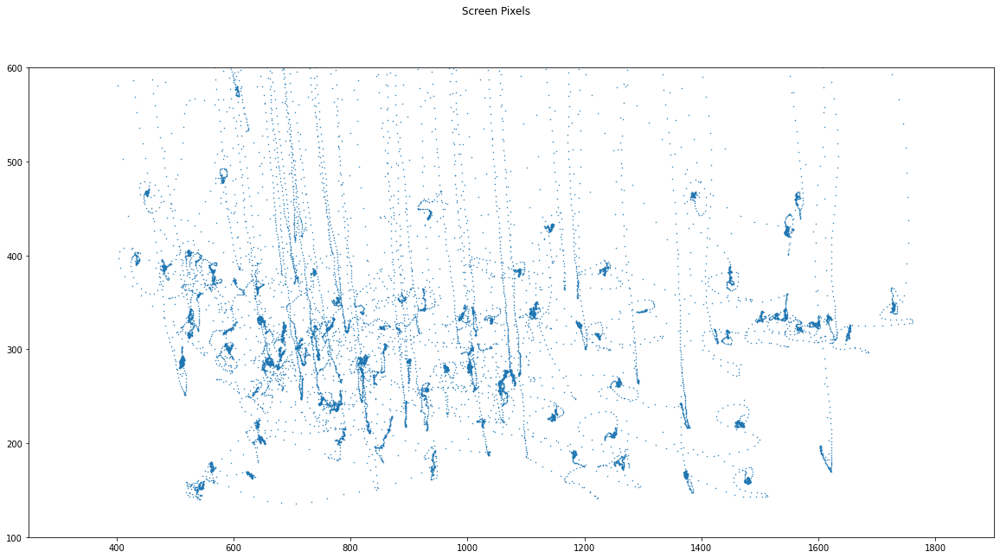

In [2]:
#!cp "drive/My Drive/Python_Codes/PyGazeAnalyser-master/pygazeanalyser/gazeplotter.py" .
#import gazeplotter

# DATA FILE .asc
file_root = 'drive/My Drive/DATA/EyeLink_1000/Mange/p0007/p07s1/p07s1b1.asc'
file_root = 'drive/My Drive/DATA/EyeLink_1000/Mange/p0004/P0004s2.asc'

# Definiciones:  
EDFSTART = "INICIO SESION NUMERO 1" # EDF file trial start message
EDFSTOP = "END" # EDF file trial end message
SEP = '\t' # value separator
TRIALORDER = [EDFSTART, EDFSTOP]
INVALCODE = 0.0 # value coding invalid data  

#Lectura datos con edfreader2, versión modificada. Creo que el resultado es un diccionario con cada variable
edfdata = edfreader2.read_edf(file_root, EDFSTART, stop=EDFSTOP, missing=INVALCODE, debug=False)

# Extracción variables desde el diccionario de resultados. El 0 refiere a "trial"
saccades = edfdata[0]['events']['Esac'] # [starttime, endtime, duration, startx, starty, endx, endy]
fixations = edfdata[0]['events']['Efix'] # [starttime, endtime, duration, endx, endy]		
		
# "raw" data points transformation to panda data frame
dfObj_x = pd.DataFrame(edfdata[0]['x'])
#Histograms of X-coordinates
dfObj_x.hist(bins=200) 
plt.xlim(0,1919)
plt.suptitle('x Pixels')
plt.show()

dfObj_y = pd.DataFrame(edfdata[0]['y'])
#Histograms in Y-coordinates
dfObj_y.hist(bins=200)
plt.xlim([0,1079]) 
plt.suptitle('y Pixels')
plt.show()



plt.figure(figsize=(20,10))

plt.plot(edfdata[0]['x'], edfdata[0]['y'],'.',markersize=1)
plt.xlim([0,1919]) 
plt.ylim([0,1079])
plt.suptitle('Screen Pixels')
plt.show()
plt.figure(figsize=(20,10))

plt.plot(edfdata[0]['x'], edfdata[0]['y'],'.',markersize=1)
plt.xlim([250,1900]) 
plt.ylim([100,600])
plt.suptitle('Screen Pixels')
#Me falta agregar al script el otro ojo

# open the file
#file = open(file_root, 'r')
	
# read the file content
#data = fl.readlines()
#for linea in data:
#  print(linea)
# close the file
#fl.close()

#data = pd.read_csv('sample_data/CogniAccion_gaze_sample.tsv',delimiter='\t')

#data = pd.read_csv('drive/My Drive/DATA/EyeLink_1000/Mange/p0007/p07s1/p07s1b1.txt',delimiter='\t')      
#PASS:


#     4/3AF_fnsrB7YtFar1aQKNa_UR0-cq3uzX4FYbOzNVaSUibDu0KDWMkBw

In [ ]:
%debug

test


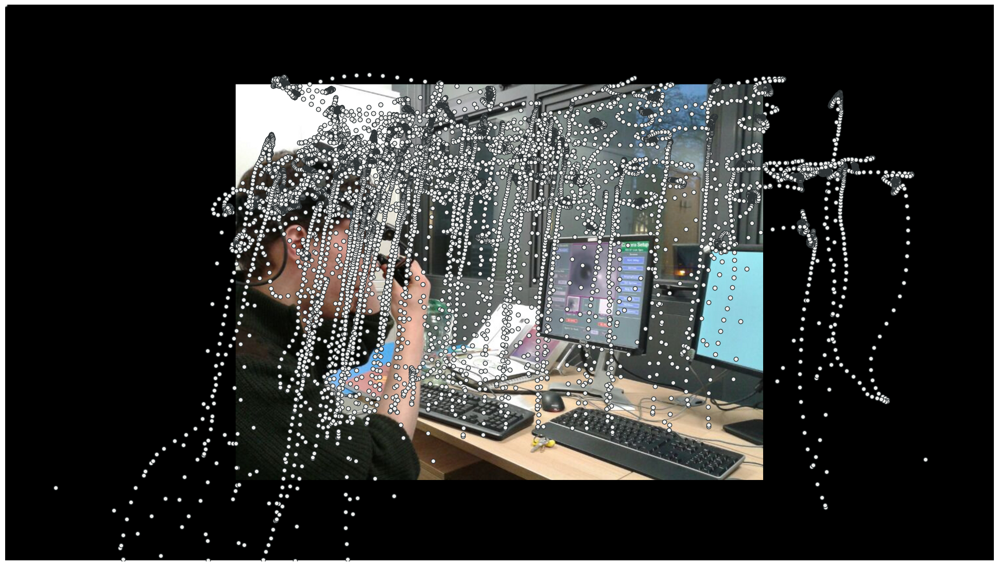

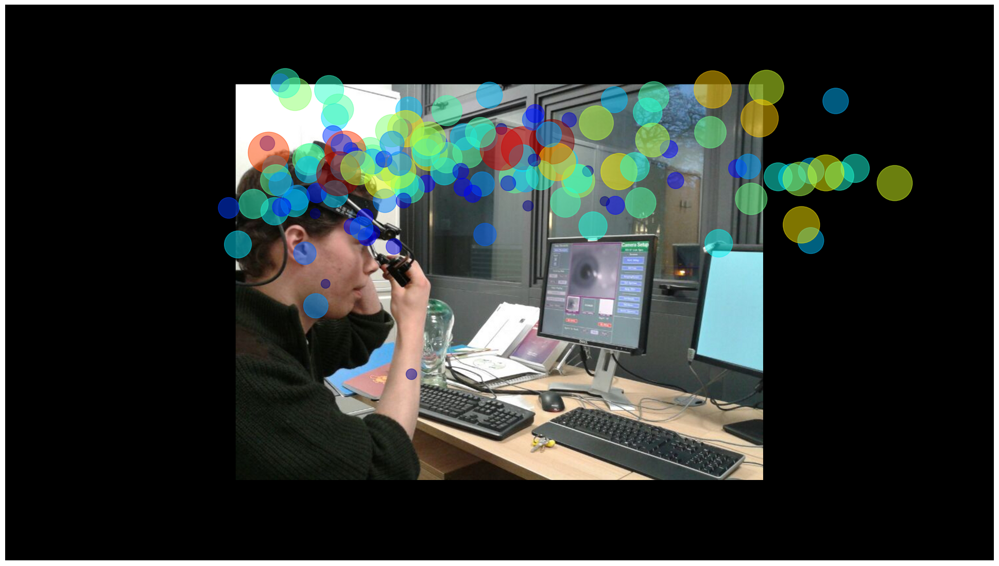

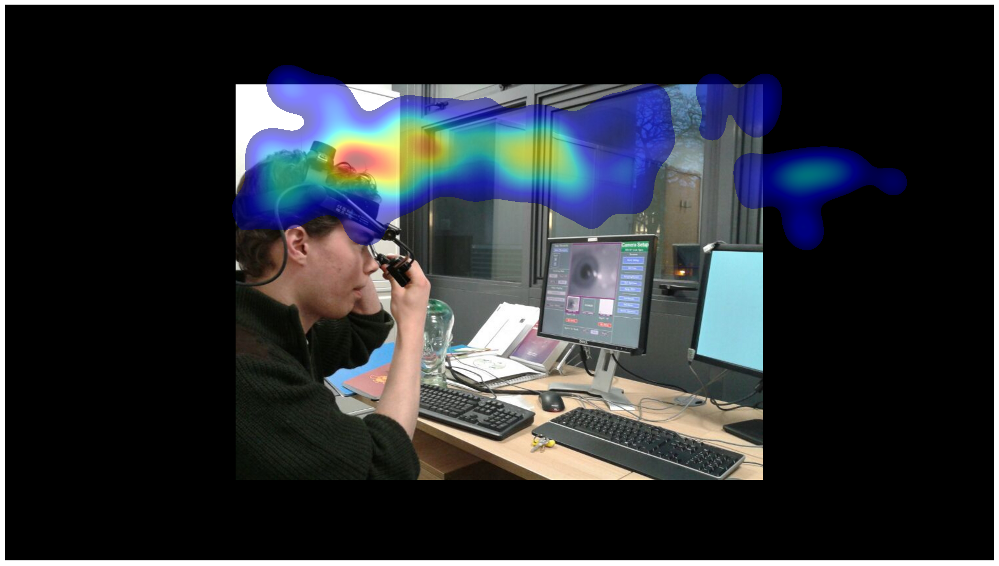

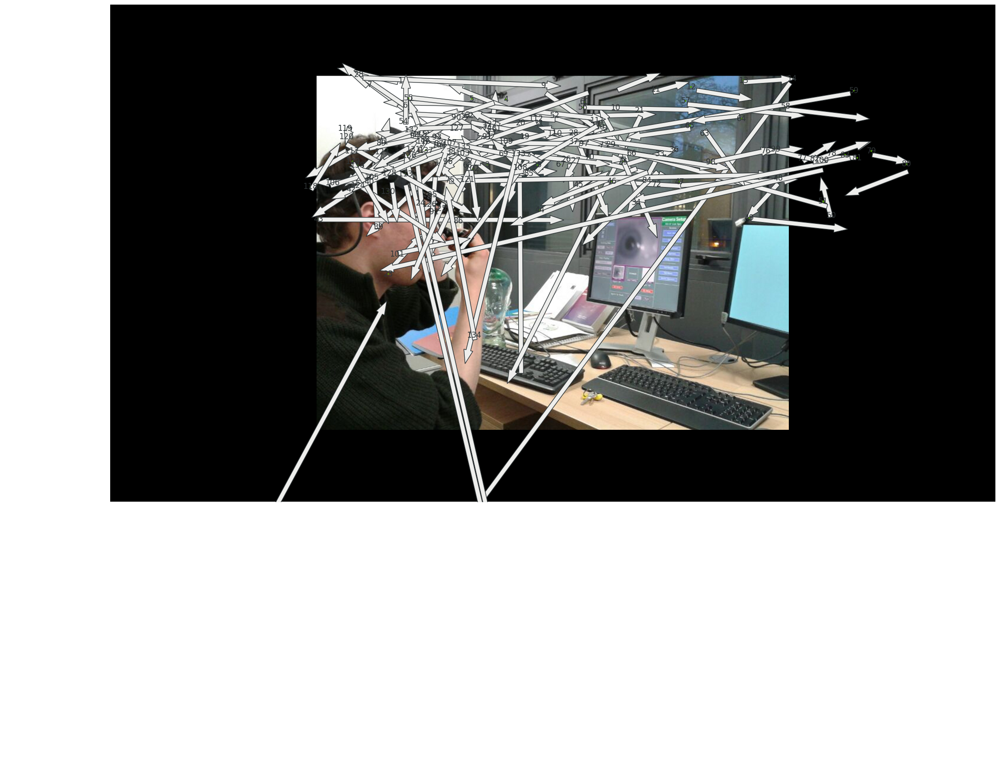

In [87]:
import importlib
!cp "drive/My Drive/Python_Codes/PyGazeAnalyser-master/pygazeanalyser/gazeplotter2.py" .
import gazeplotter2
importlib.reload(gazeplotter2)

# paths to save plots
imagefile = 'drive/My Drive/Python_Codes/PyGazeAnalyser-master/examples/analysis/imgs/EyeLink_II.jpg'
heatmapfile = 'drive/My Drive/Python_Codes/PyGazeAnalyser-master/examples/analysis/imgs/heatmap_test'
rawplotfile = 'drive/My Drive/Python_Codes/PyGazeAnalyser-master/examples/analysis/imgs/rawplot_test'
scanpathfile= 'drive/My Drive/Python_Codes/PyGazeAnalyser-master/examples/analysis/imgs/scanpath_test'
DISPSIZE=(1920,1080)
#plt.xlim(0,1079)
gazeplotter2.draw_raw(edfdata[0]['x'], edfdata[0]['y'], DISPSIZE, imagefile=imagefile, savefilename=None)
gazeplotter2.draw_fixations(fixations, DISPSIZE, imagefile=imagefile, durationsize=True, durationcolour=True, alpha=0.5, savefilename=None)
gazeplotter2.draw_heatmap(fixations, DISPSIZE, imagefile=imagefile, durationweight=True, alpha=0.5, savefilename=None)
gazeplotter2.draw_scanpath(fixations, saccades, DISPSIZE, imagefile=imagefile, alpha=1, savefilename=None)


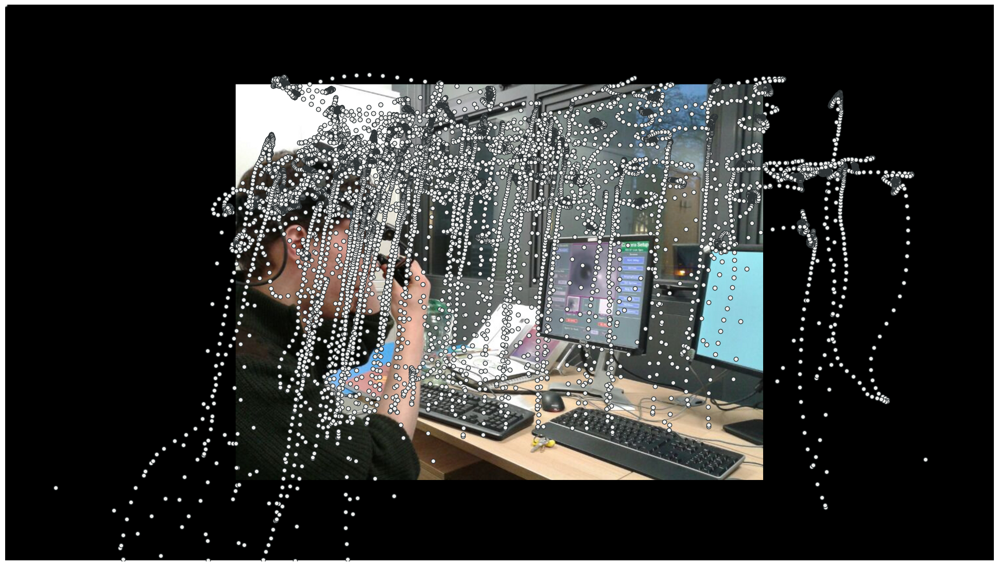

In [88]:
gazeplotter2.draw_raw(edfdata[0]['x'], edfdata[0]['y'], DISPSIZE, imagefile=imagefile, savefilename=None)


In [ ]:
gazeplotter2.draw_fixations(fixations, DISPSIZE, imagefile=imagefile, durationsize=True, durationcolour=True, alpha=0.7, savefilename=None)


In [ ]:
gazeplotter2.draw_heatmap(fixations, DISPSIZE, imagefile=imagefile, durationweight=True, alpha=0.5, savefilename=None)



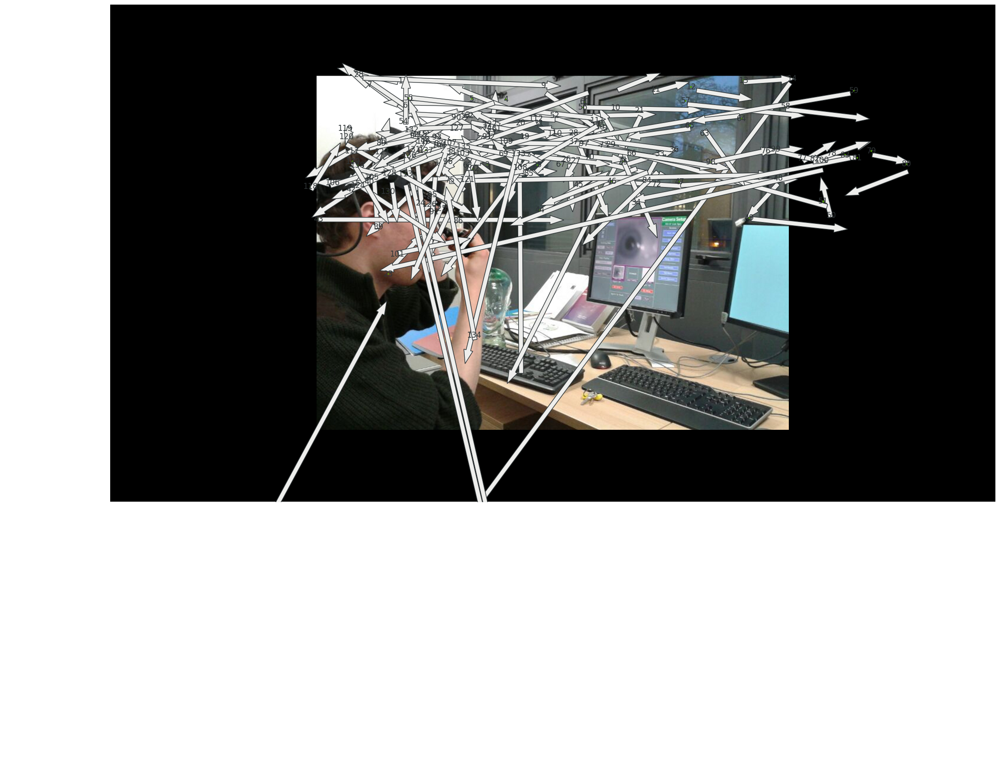

In [89]:
gazeplotter2.draw_scanpath(fixations, saccades, DISPSIZE, imagefile=imagefile, alpha=1, savefilename=None)

In [ ]:
import importlib
!cp "drive/My Drive/Python_Codes/PyGazeAnalyser-master/pygazeanalyser/gazeplotter2.py" .
import gazeplotter2

#importlib.reload(gazeplotter2)

DISPSIZE=(1900,1000)
img = 'drive/My Drive/Python_Codes/PyGazeAnalyser-master/examples/analysis/imgs/EyeLink_II.jpg'

#img = mpimg.imread(img)
#imgplot = plt.imshow(img)
#plt.show()

rawplotfile = 'drive/My Drive/Python_Codes/out/raw'


gazeplotter2.draw_raw(edfdata[0]['x'], edfdata[0]['y'], DISPSIZE, imagefile=img, savefilename=rawplotfile)

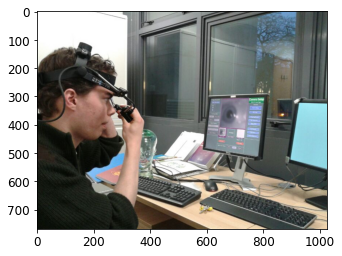

In [ ]:
import matplotlib.image as mpimg

DISPSIZE=(1900,1000)
img = 'drive/My Drive/Python_Codes/PyGazeAnalyser-master/examples/analysis/imgs/EyeLink_II.jpg'

img = mpimg.imread(img)
imgplot = plt.imshow(img)
plt.show()



#draw_raw(edfdata[0]['x'], edfdata[0]['y'], DISPSIZE, imagefile=imagefile, savefilename=rawplotfile)
